## -1. To Do
Make it compatible for N dimensional latent space.

# 0. Imports and setup

In [34]:
%matplotlib inline
import numpy as np
from numpy import genfromtxt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import matplotlib
import matplotlib.pyplot as plt
from torchsummary import summary
from tqdm.notebook import tqdm
from datetime import datetime
import scipy.stats


from PIL import Image
import glob

# MATLAB (Octave) setup
# Add m functions to the path

from oct2py import octave
octave.addpath('../MMA_SurrOpt_2023/')
octave.warning('off', 'Octave:possible-matlab-short-circuit-operator');

# convert the .m file into a csv file


# Template for running .m file
# octave.eval("""function [a, b] = toto(c);
#     a = c;
#     b = c + 1;
# end""")
# a,b = octave.eval("toto(3, nout =2)")
# a,b = octave.toto(3, nout = 2)
# print(a,b)


In [35]:
seed = 23
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
torch.backends.cudnn.benchmark = False

#True does not work :(
torch.use_deterministic_algorithms(False)

In [36]:
#Turn .mat to .csv
import scipy.io
mat = scipy.io.loadmat('data1209/1209log.mat')
print(mat['log'])
print(len(mat['log'][0]))
np.savetxt( "data1209/log1209.csv", mat['log'][0], delimiter=',')

[[8.83279632 7.56540165 8.01668332 ... 6.12575887 6.19414605 5.26265469]]
2187


## 0.1 Test torch 🔋

In [37]:
import torch
x = torch.rand(5, 3)
print(x)

tensor([[0.4283, 0.2889, 0.4224],
        [0.3571, 0.9577, 0.1100],
        [0.2933, 0.9205, 0.5876],
        [0.1299, 0.6729, 0.1028],
        [0.7876, 0.5540, 0.4653]])


## 1. Load data

In [38]:
# Initialize the container
design_vectors = [] # 
blfs = []

# path to the dataset (png files)
# path = 'E:\dev\Fall23Project\dataset/*.png'
# path_dummy = 'E:\dev\Fall23Project\dataset_dummy/*.png'
# path_buckling = "E:\dev\Fall23Project\dataset\Images/*.png"
# path_buckling = "data2000/Images/*.png"
# path_buckling_csv = "data2000/csvfiles/"
path_buckling = "data2000/Images/*.png"

# load buckling vector to the dataset.
blf_vector = genfromtxt("data1209/log1209.csv", delimiter=',')

#define new sizes
# new_size = (256,64)
new_size = (240,120)
x_size = []
y_size = []
for filename in glob.glob(path_buckling):
    # print(filename)
    # get idx, which is the filename without .png
    # idx = filename.split("\\")[-1].strip(".png")
    # print(filename)
    print(filename)
    idx = filename.split("\\")[-1].strip(".png")
    # print(idx)

    # idx = filename.split("\\")[-1].strip(".csv")
    # print(idx)
    my_data = genfromtxt("data2000/csvfiles/"+ idx+".csv", delimiter=',')
    im = Image.fromarray(my_data)

    # im=Image.open(path_buckling_csv+idx+".csv").convert('L')
    #Match the filename to the blf.
    blf_val = blf_vector[int(idx)-1]

    # image conversion to color
    # im=Image.open(filename).convert('L')
    

    if np.size(im) != new_size:
        # resize with the new_size
        print(np.size(im), " converted to ", new_size)
        x_size.append(np.size(im)[0])
        y_size.append(np.size(im)[1])
        im = im.resize(new_size, resample=0)
    
    # Normalize to be in between [0,1] and turn to array
    im_array = np.expand_dims(np.array(im).astype(np.float32), axis = 0)

    #Flatten the image to a 1D vector
    im_array_flatten = im_array.reshape(240*120)  # flatten x  shape[0] is the batch size, -1 is the last dimension of x

    #append the blf value into the 1D image vector.
    thisvector = np.append(im_array_flatten,blf_val)

    #append "this" design_vector into design_vectors
    design_vectors.append(thisvector)#


data2000/Images\1.png
data2000/Images\1000.png
data2000/Images\1001.png
data2000/Images\1002.png
data2000/Images\1012.png
data2000/Images\1013.png
data2000/Images\1014.png
data2000/Images\1015.png
data2000/Images\1016.png
data2000/Images\1017.png
data2000/Images\1024.png
data2000/Images\1025.png
data2000/Images\1026.png
data2000/Images\1027.png
data2000/Images\1028.png
data2000/Images\1029.png
data2000/Images\1039.png
data2000/Images\1040.png
data2000/Images\1041.png
data2000/Images\1042.png
data2000/Images\1043.png
data2000/Images\1044.png
data2000/Images\1051.png
data2000/Images\1052.png
data2000/Images\1053.png
data2000/Images\1054.png
data2000/Images\1055.png
data2000/Images\1056.png
data2000/Images\106.png
data2000/Images\1066.png
data2000/Images\1067.png
data2000/Images\1068.png
data2000/Images\1069.png
data2000/Images\107.png
data2000/Images\1070.png
data2000/Images\1071.png
data2000/Images\1078.png
data2000/Images\1079.png
data2000/Images\108.png
data2000/Images\1080.png
data20

Recheck out input

In [39]:
print("All input shapes")
design_vectors = np.array(design_vectors)

print(design_vectors.shape)

print("Each image shape")
print(design_vectors[0][:-1].reshape(new_size).shape)
print(max(design_vectors[0][:-1]))
print(np.mean(design_vectors[0][:-1]))

All input shapes
(942, 28801)
Each image shape
(240, 120)
1.0
0.2499979247708744


Visualize distribution of the input dataset

In [40]:
print(design_vectors[0].shape)
design_vectors[0,:-1].reshape(120,240).shape
print(design_vectors.shape)

(28801,)
(942, 28801)


Dataset:  8.642255932559088
Matlab:  8.642255931899449


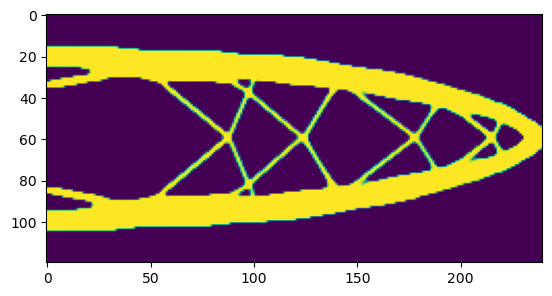

In [41]:
# print(design_vectors[0,:-1].reshape(120,240))
# design_vectors[design_vectors < 0.001] = 0
n = 1
plt.imshow(design_vectors[n,:-1].reshape(120,240))


np.savetxt("test_matlab.csv", design_vectors[n,:-1].reshape(120,240), delimiter=',')
calc_blf = octave.getblf("test_matlab", nout = 1)
# another_blf = octave.getblf("data2000/csvfiles/1")
print("Dataset: ", design_vectors[n,-1])
print("Matlab: ", calc_blf)
# print("Matlab but from csv ", another_blf)
# Matlab:  0.0026568316587896484

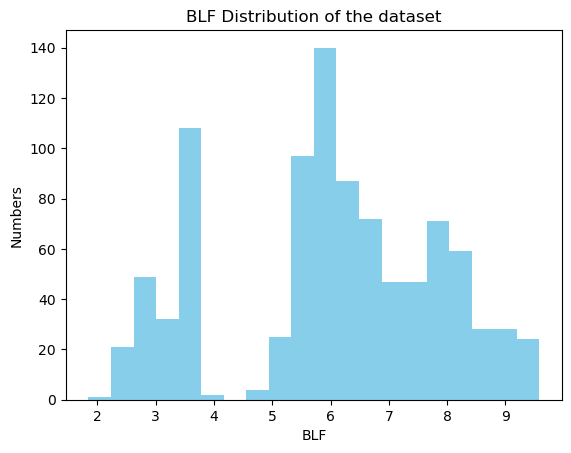

In [42]:
fig, ax = plt.subplots() 
plt.title('BLF Distribution of the dataset')
plt.hist(design_vectors[:,-1], bins = 20, color = 'skyblue')
ax.set_xlabel("BLF")
ax.set_ylabel("Numbers")
plt.savefig("Plots/BLF_distribution")
plt.show() 


In [43]:
print(design_vectors)

[[4.24313766e-04 4.26980958e-04 4.27797146e-04 ... 1.68564075e-04
  1.68564075e-04 8.83279632e+00]
 [3.82330210e-04 4.25774226e-04 3.87553679e-04 ... 3.87415290e-04
  3.87415261e-04 8.64225593e+00]
 [1.36072471e-04 1.40473159e-04 1.29540276e-04 ... 2.64849632e-06
  2.64849632e-06 8.23010351e+00]
 ...
 [6.38269412e-04 6.38942292e-04 6.38773665e-04 ... 6.38361962e-04
  6.38361962e-04 6.30873659e+00]
 [2.04389129e-04 2.04346623e-04 2.04280135e-04 ... 2.02987285e-04
  2.02987285e-04 6.81096700e+00]
 [2.75906466e-04 2.74173362e-04 2.71186727e-04 ... 2.62853457e-04
  2.62923510e-04 5.80945350e+00]]


[[4.38320683e-04 4.38319257e-04 4.38316580e-04 ... 4.38599323e-04
  4.38599323e-04 5.98400052e+00]
 [2.56862200e-04 2.56941945e-04 2.57049978e-04 ... 2.54099024e-04
  2.53850740e-04 5.98733864e+00]
 [2.68468808e-04 2.62288173e-04 2.53606850e-04 ... 2.55841354e-04
  2.55472580e-04 5.98897177e+00]
 ...
 [2.27477564e-03 2.27500475e-03 2.27524876e-03 ... 2.27688858e-03
  2.27688858e-03 9.53626647e+00]
 [1.71690236e-03 1.73890253e-03 1.76155719e-03 ... 1.73498539e-03
  1.73498539e-03 9.57271454e+00]
 [1.15841243e-03 1.15820707e-03 1.15806249e-03 ... 1.15464022e-03
  1.15464022e-03 9.58242845e+00]]


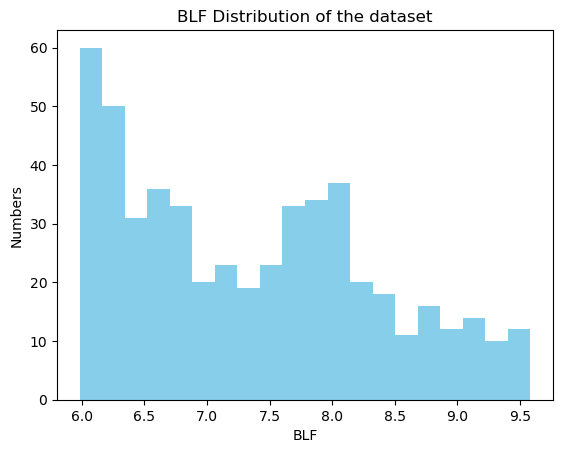

In [44]:
X = design_vectors
Y = [i[-1] for i in design_vectors]
good_design_vectors = np.array([x for _, x in sorted(zip(Y, X), key=lambda pair: pair[0])][-512:])
print(good_design_vectors)


fig, ax = plt.subplots() 
plt.title('BLF Distribution of the dataset')
plt.hist(good_design_vectors[:,-1], bins = 20, color = 'skyblue')
ax.set_xlabel("BLF")
ax.set_ylabel("Numbers")
# plt.savefig("Plots/BLF_distribution")
plt.show() 


In [45]:
design_vectors = good_design_vectors

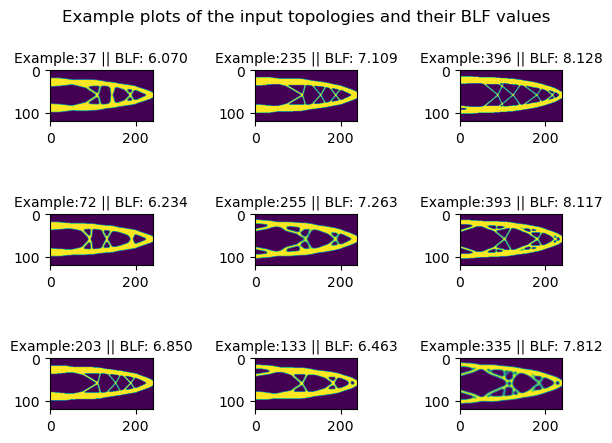

In [46]:
n = 3

fig = plt.figure()
plt.suptitle("Example plots of the input topologies and their BLF values")

plt.axis('off') 
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=1, 
                    hspace=0.5)

np.random.seed(seed=1) #for reproducibility
count = 0
for i in range(1,n+1):
    for j in range(1,n+1):
        count +=1 
        fig.add_subplot(n, n, count) 

        idx = np.random.randint(0, len(design_vectors))
        plt.imshow(design_vectors[idx,:-1].reshape(120,240))
        plt.title("Example:"+ str(idx)+ " || BLF: {0:.3f}".format(design_vectors[idx,-1])) 
        a=plt.gca()
        a.title.set_size(10)

np.random.seed(seed=None)
plt.savefig("Plots/Example_Plots_of_inputs")


In [47]:
from torch.utils.data import DataLoader
from random import shuffle

batch_size = 64
print("\nTotal datapoints")
print(len(design_vectors))


shuffle(design_vectors)
# Training 70%, validating 30%
training_set = design_vectors[:int(len(design_vectors)*0.7)]
validating_set = design_vectors[int(len(design_vectors)*0.7)+1:]


print("\nTraining Set shape")
print(training_set.shape)
print("\nValidation Images")
print(validating_set.shape)

# turn into tensors -> compatibal format for Dataloader.
training_set = torch.Tensor(training_set)
training_set = np.array(training_set)
training_dataloader = DataLoader(training_set, shuffle= True, batch_size = batch_size) # create your dataloader

validating_set = torch.Tensor(validating_set)
validating_set = np.array(validating_set)
validating_dataloader = DataLoader(validating_set, shuffle= True, batch_size = batch_size) # create your dataloader



Total datapoints
512

Training Set shape
(358, 28801)

Validation Images
(153, 28801)


In [48]:
print(training_set)

[[4.3832068e-04 4.3831926e-04 4.3831658e-04 ... 4.3859932e-04
  4.3859932e-04 5.9840007e+00]
 [2.5686220e-04 2.5694194e-04 2.5704998e-04 ... 2.5409902e-04
  2.5385074e-04 5.9873385e+00]
 [4.3832068e-04 4.3831926e-04 4.3831658e-04 ... 4.3859932e-04
  4.3859932e-04 5.9840007e+00]
 ...
 [5.7347072e-04 5.7377241e-04 5.7461625e-04 ... 5.8366783e-04
  5.8366783e-04 6.7108307e+00]
 [3.0562346e-04 3.0555652e-04 3.0544205e-04 ... 3.0559182e-04
  3.0558987e-04 6.3901515e+00]
 [7.6666457e-04 7.7290589e-04 7.8102591e-04 ... 8.5668510e-04
  8.5668423e-04 7.3258276e+00]]


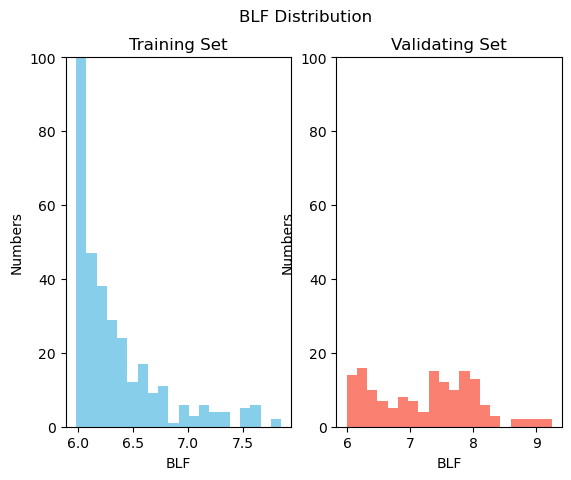

In [49]:
# histrogram of the distribution of the training and the validating sets
fig = plt.figure()
plt.suptitle("BLF Distribution")

fig.add_subplot(1, 2, 1) 
plt.title('Training Set')
plt.hist(training_set[:,-1], bins = 20, color = 'skyblue')
a=plt.gca()
a.set_xlabel("BLF")
a.set_ylabel("Numbers")
a.set_ylim([0, 100])

fig.add_subplot(1,2,2)
plt.title('Validating Set')
plt.hist(validating_set[:,-1], bins = 20, color = 'salmon')
a=plt.gca()
a.set_xlabel("BLF")
a.set_ylabel("Numbers")
a.set_ylim([0, 100])


plt.savefig("Plots/BLF_distribution_for_Training_Validating_sets")

## 2. Define VAE



(Depreciated) Autoencoder

In [50]:
class AutoEncoder(torch.nn.Module):
    def __init__(self, encoder, decoder):
        super(AutoEncoder, self).__init__()
        self.encoder = encoder
        self.decoder = decoder

        # can use other losses too, MAE, etc.
        self.loss = torch.nn.MSELoss() 

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    def reconstruction_loss(self, input_image, target_image):
        return self.loss(input_image, target_image) 
    

Encoder and Decoder

In [51]:
class Encoder(torch.nn.Module):
  #we are dealing with images -> use convolutional network.
    def __init__(self, latent_dimensionality=2):
        super(Encoder, self).__init__()
        input_size_flatten = (120*240 + 1)

        self.fc_1 = torch.nn.Linear(in_features= input_size_flatten, out_features=1000)
        self.fc_2 = torch.nn.Linear(in_features= 1000, out_features=100)
        #add blf to it, so the size become 100 + 1 
        self.fc_3 = torch.nn.Linear(in_features= 100 + 1 , out_features=latent_dimensionality)
    
    def forward(self, x):
        #pull blf values out (for skip connection)
        blf = torch.unsqueeze(x[...,-1],1)

        x = self.fc_1(x)
        x = F.relu(x)
        x = self.fc_2(x)
        x = F.relu(x)

        #We add blf again here
        x = torch.cat([x,blf], dim=-1)
        x = self.fc_3(x)
        return x
    
# the decoder essentially mirrors the architecture of the encoder
class Decoder(torch.nn.Module):
    def __init__(self, latent_dimensionality=2):
        super(Decoder, self).__init__()

        self.fc_1 = torch.nn.Linear(in_features=latent_dimensionality, out_features=100)
        self.fc_2 = torch.nn.Linear(in_features=100, out_features = 1000)
        self.fc_3 = torch.nn.Linear(in_features=1000, out_features = 120*240 + 1)

    
    def forward(self, x):
        
        x = self.fc_1(x)
        x = F.relu(x)
        x = self.fc_2(x)
        x = F.relu(x)
        x = self.fc_3(x)
      
        x1 = torch.sigmoid(x[...,:-1])  # squeeze pixel value between 0 and 1
        x2 = torch.unsqueeze(x[...,-1],1)

        x = torch.cat([x1,x2], dim =-1)
        return x

In [52]:
class VariationalAutoEncoder(AutoEncoder):
    def __init__(self, encoder, decoder, latent_dimensionality):
        super(VariationalAutoEncoder, self).__init__(encoder, decoder)

        self.latent_dimensionality = latent_dimensionality

        # self.weights_initialization()
    def forward(self, x):
        x = self.encoder(x)

        mu = x[:, : self.latent_dimensionality]
        log_variance = x[:, self.latent_dimensionality :]
        # sample from gaussian dis
        # project to log sigma^2 so we dont get negative values.
        variance = torch.exp(log_variance)
        eps = torch.randn_like(variance) #sample from a normal distribution
        sample = mu + torch.sqrt(variance) * eps #randomly scale, close to mu but not mu.
        x = self.decoder(sample)
        return x, mu, log_variance 

    def kullback_leibler_divergence(self, mu, log_variance):
        return 0.5 * torch.mean(mu ** 2 + torch.exp(log_variance) - (1 + log_variance))
    
    # def weights_initialization(self):
    #     for m in self.modules():
    #         if isinstance(m, nn.Linear):
    #             nn.init.xavier_normal_(m.weight)
    #             nn.init.constant_(m.bias, 0)

In [53]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [54]:
vae_model = VariationalAutoEncoder(
    Encoder(latent_dimensionality= 4),
    Decoder(latent_dimensionality= 2),
    latent_dimensionality= 2,
).to(device)

Check initial weights (should be all 1)

In [55]:
optimizer = torch.optim.Adam(vae_model.parameters(), lr=0.001)

(tensor([[1.8247e-03, 1.9945e-03, 2.0300e-03,  ..., 1.7391e-03, 2.1627e-03,
         6.0750e+00],
        [1.5741e-03, 1.5506e-03, 1.4953e-03,  ..., 1.4623e-03, 1.8033e-03,
         6.0358e+00],
        [1.9660e-03, 1.9488e-03, 1.9292e-03,  ..., 1.8544e-03, 2.1561e-03,
         5.9984e+00],
        ...,
        [2.0937e-03, 2.0934e-03, 2.1026e-03,  ..., 1.9895e-03, 2.2746e-03,
         6.0086e+00],
        [1.2383e-03, 1.0565e-03, 1.0442e-03,  ..., 1.2845e-03, 1.2932e-03,
         6.2585e+00],
        [1.4777e-03, 1.3142e-03, 1.2682e-03,  ..., 1.4481e-03, 1.5661e-03,
         6.1758e+00]], device='cuda:0', grad_fn=<CatBackward0>), tensor([[-0.4484, -0.8385],
        [-0.4447, -0.7882],
        [-0.4525, -0.8391],
        [-0.4528, -0.8185],
        [-0.3799, -0.7510],
        [-0.4577, -0.8139],
        [-0.4468, -0.7942],
        [-0.4243, -0.7695],
        [-0.4363, -0.8077],
        [-0.4022, -0.7825],
        [-0.4027, -0.7772],
        [-0.4163, -0.7557],
        [-0.4502, -0.7840

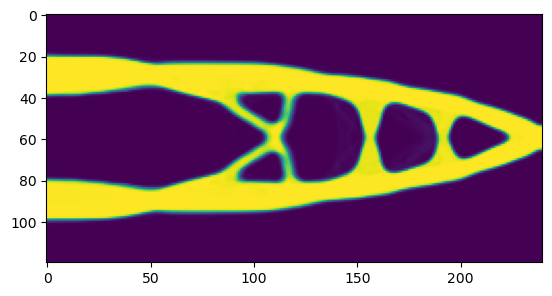

In [80]:
input_tensor = torch.rand(64, 120*240 + 1).to(device)

# Call the autoencoder
output = vae_model(input_tensor)
print(output)
# print(output.size())
imgplot = plt.imshow(output[0][0,:-1].reshape(120,240).detach().cpu().numpy())

In [57]:
training_losses = []
validating_losses = []
tl = []
vl = []

Setting the seed (for reproducibility)

In [58]:
# with torch.no_grad():
#     for layer in vae_model.state_dict():
#         print(layer)
#         #print(torch.ones_like(mask_model.state_dict()[layer].data))
#         vae_model.state_dict()[layer].data.fill_(0.001)


# vae_model.state_dict().values()

In [59]:
n_epochs = 200
n_epochs = 1000
reporting_frequency = 5

for i in tqdm(range(1, n_epochs + 1)):

    # training
    for j, (vector_input) in enumerate(training_dataloader):
        optimizer.zero_grad()
        vector_input = vector_input.to(device)
        reconstructed, mu, log_variance = vae_model(vector_input)
        reconstruction_loss = vae_model.reconstruction_loss(reconstructed, vector_input)
        # print(reconstruction_loss)
        kl_divergence_loss = vae_model.kullback_leibler_divergence(mu, log_variance)
        # print(kl_divergence_loss)
        #loss has 2 terms -> reconstruction loss and kl_divergence_loss
        #scale 0.01 so it't not too big/small so it includes the kl_divergence, but not too much that interrupt the workflow.
        loss = reconstruction_loss + 0.01 * kl_divergence_loss
        # print(loss)

        loss.backward()
        optimizer.step()
        # print(loss)
        training_losses.append( [ i,j,loss.detach().cpu().numpy() ])
        tl.append( loss.detach().cpu().numpy())
        if (j + 1) % reporting_frequency == 0:
            print(
                "Epoch {0} | Mean training loss after {1} batches: {2:.3f}".format(
                    i, j + 1, np.mean(tl)
                )
            )

    # validating
    for j, (vector_input) in enumerate(validating_dataloader):
        vector_input = vector_input.to(device)
        reconstructed, _, _ = vae_model(vector_input)
        loss = vae_model.reconstruction_loss(reconstructed, vector_input)
        # print(loss)
        validating_losses.append( [i,j,loss.detach().cpu().numpy()])
        vl.append( loss.detach().cpu().numpy())

    print(
        "Epoch {0} | Mean training total loss: {1:.3f} | Mean validating reconstruction loss: {2:.3f}".format(
            i, np.mean(tl), np.mean(vl)
        )
    )

  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1 | Mean training loss after 5 batches: 0.345
Epoch 1 | Mean training total loss: 1.271 | Mean validating reconstruction loss: 0.088
Epoch 2 | Mean training loss after 5 batches: 0.219
Epoch 2 | Mean training total loss: 1.403 | Mean validating reconstruction loss: 0.085
Epoch 3 | Mean training loss after 5 batches: 0.164
Epoch 3 | Mean training total loss: 1.553 | Mean validating reconstruction loss: 0.085
Epoch 4 | Mean training loss after 5 batches: 0.134
Epoch 4 | Mean training total loss: 1.710 | Mean validating reconstruction loss: 0.084
Epoch 5 | Mean training loss after 5 batches: 0.114
Epoch 5 | Mean training total loss: 1.870 | Mean validating reconstruction loss: 0.084
Epoch 6 | Mean training loss after 5 batches: 0.100
Epoch 6 | Mean training total loss: 2.033 | Mean validating reconstruction loss: 0.084
Epoch 7 | Mean training loss after 5 batches: 0.091
Epoch 7 | Mean training total loss: 2.196 | Mean validating reconstruction loss: 0.084
Epoch 8 | Mean training los

In [60]:
training_pos = [i+j/len(training_dataloader) for (i,j,_) in training_losses]
validating_pos = [i+j/len(validating_dataloader) for (i,j,_) in validating_losses]


training_losses_values = [k for (_,_,k) in training_losses]
validating_losses_values = [ k  for (_,_,k) in validating_losses]

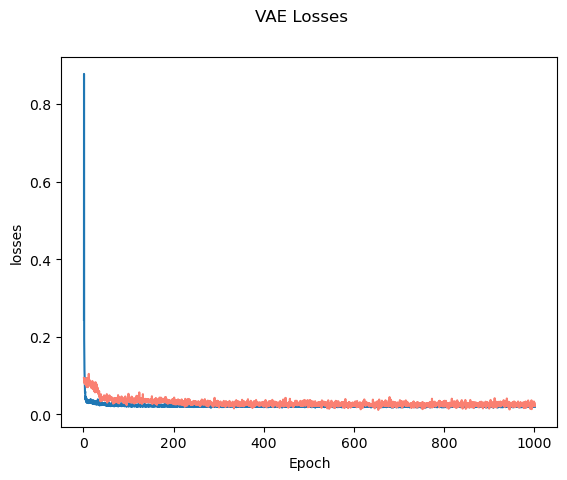

In [63]:
#plot losses
pos = [i+j for (i,j,_) in training_losses]


fig, (ax1) = plt.subplots(1, 1)
fig.suptitle('VAE Losses')

ax1.set_ylabel('losses')
ax1.set_xlabel("Epoch")
# p1 = ax1.plot(np.log(training_losses))
p1 = ax1.plot(training_pos , training_losses_values)

# ax2.set_ylabel('Log(Validating losses)')
p2 = ax1.plot(validating_pos, validating_losses_values, c = 'salmon')

plt.show

plt.savefig("Plots/VAE_losses")



In [64]:
vae_model.eval() #put this to inference mode.

VariationalAutoEncoder(
  (encoder): Encoder(
    (fc_1): Linear(in_features=28801, out_features=1000, bias=True)
    (fc_2): Linear(in_features=1000, out_features=100, bias=True)
    (fc_3): Linear(in_features=101, out_features=4, bias=True)
  )
  (decoder): Decoder(
    (fc_1): Linear(in_features=2, out_features=100, bias=True)
    (fc_2): Linear(in_features=100, out_features=1000, bias=True)
    (fc_3): Linear(in_features=1000, out_features=28801, bias=True)
  )
  (loss): MSELoss()
)

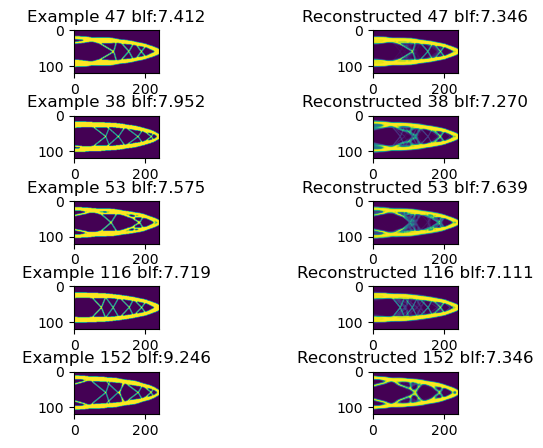

In [65]:
n = 5

fig = plt.figure()
plt.axis('off') 
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=1)

np.random.seed(seed=1234) #for reproducibility
for i in range(1,n+1):
    fig.add_subplot(n, 2, 2*i-1) 
    idx = np.random.randint(0, len(validating_set))

    
    design_vector = validating_set[idx,:]
    image_vector = design_vector[:-1]
    blf_val = design_vector[-1]

    plt.imshow(image_vector.reshape(120,240))
    # plt.title("Example:"+ str(idx) + " blf:" +str(blf_val)) 
    plt.title("Example {0} blf:{1:.3f}".format(idx, blf_val)) 
    fig.add_subplot(n, 2, 2*i) 

    reconstructed_vector,_,_ = vae_model(torch.tensor(design_vector.astype(np.float32)).to(device).unsqueeze(0))
    # print(len(reconstructed_vector))
    # print(reconstructed_vector)
    reconstructed_image = reconstructed_vector[0,:-1].detach().reshape(120,240).cpu()
    reconstructed_blf = reconstructed_vector[0,-1].detach().cpu().numpy()


    plt.imshow(reconstructed_image)
    #  "Epoch {0} | Mean training loss: {1:.3f} | Mean validating loss: {2:.3f}".format(
    #         i, np.mean(training_losses), np.mean(validating_losses)
    #     )
    plt.title("Reconstructed {0} blf:{1:.3f}".format(idx, reconstructed_blf)) 


np.random.seed(seed=None)

plt.savefig("Plots/Reconsturcted_topology")

# Check Predicted vs Actual BLF values

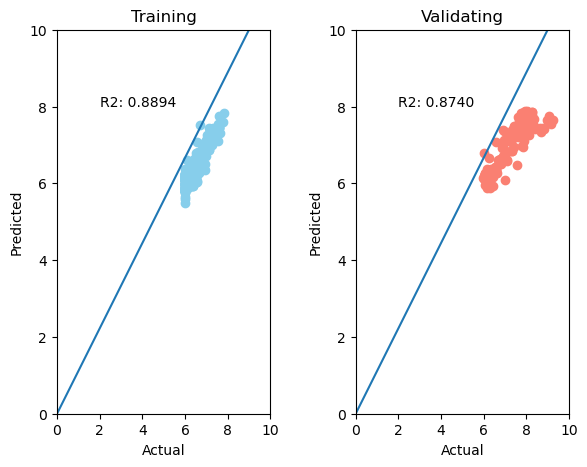

In [66]:
fig = plt.figure()
fig.add_subplot(1,2,1)
plt.title("Training")
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=1)
a = plt.gca()
a.set_xlabel("Actual")
a.set_ylabel('Predicted')
a.set_xlim([0, 10])
a.set_ylim([0, 10])
plt.plot(np.linspace(0,10,10))

training_reconstructed_blf_array = []
for i in range(len(training_set)):
# for i in range(1):    
    design_vector = training_set[i,:]

    image_vector = design_vector[:-1]
    blf_val = design_vector[-1]

    reconstructed_vector, mu, log_variance= vae_model(torch.tensor(design_vector.astype(np.float32)).to(device).unsqueeze(0))

    reconstructed_blf = reconstructed_vector[0,-1].detach().cpu().numpy()
    plt.scatter(blf_val, reconstructed_blf, c = 'skyblue')
    training_reconstructed_blf_array.append(reconstructed_blf)

slope, intercept, r_value1, p_value, std_err = scipy.stats.linregress(training_set[:,-1], training_reconstructed_blf_array)
plt.text(2,8, "R2: {x:.4f}".format(x = r_value1))

fig.add_subplot(1,2,2)
plt.plot(np.linspace(0,10,10))
plt.title("Validating")
a = plt.gca()
a.set_xlabel("Actual")
a.set_ylabel('Predicted')
a.set_xlim([0, 10])
a.set_ylim([0, 10])
###########################################
validating_reconstructed_blf_array = []
for i in range(len(validating_set)):
# for i in range(1):    
    design_vector = validating_set[i,:]

    image_vector = design_vector[:-1]
    blf_val = design_vector[-1]

    reconstructed_vector, mu, log_variance= vae_model(torch.tensor(design_vector.astype(np.float32)).to(device).unsqueeze(0))

    reconstructed_blf = reconstructed_vector[0,-1].detach().cpu().numpy()
    plt.scatter(blf_val, reconstructed_blf, c = 'salmon')
    validating_reconstructed_blf_array.append(reconstructed_blf)

slope, intercept, r_value2, p_value, std_err = scipy.stats.linregress(validating_set[:,-1], validating_reconstructed_blf_array)
plt.text(2,8, "R2: {x:.4f}".format(x = r_value2))

plt.savefig("Plots/Predict_vs_Actual_plot")

Get all of the encodings + plot them into a space

In [67]:
def get_all_encodings(model, dataloader):
    all_encoded = []
    all_blf = []
    for _ , input_vector in enumerate(dataloader):
        encoding = model.encoder(input_vector.to(device)).detach().cpu().numpy()
        all_encoded.append(encoding)
        # print(input_vector.shape)
        all_blf.append(input_vector[:,-1])
        #all_labels.append(labels.numpy())

    all_encoded = np.concatenate(all_encoded)
    all_blf = np.concatenate(all_blf)

    return all_encoded , all_blf


def plot_topopt_encoding(model):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Training data
    ax[0].set_title(label="Encoding of Topology training set")
    all_encoded_train, all_blf_train = get_all_encodings(model, training_dataloader)
    training_bbox = np.min(all_encoded_train, axis=0), np.max(all_encoded_train, axis=0)

    scatter1 = ax[0].scatter(
        all_encoded_train[:, 0],
        all_encoded_train[:, 1],
        c=all_blf_train,
        alpha=0.2,
        cmap="plasma",
        label="Training",
    )
    # plt.colorbar(scatter1)

    # Validation data
    ax[1].set_title(label="Encoding of Topology validating set")
    all_encoded, all_blf = get_all_encodings(model, validating_dataloader)
    validating_bbox = np.min(all_encoded, axis=0), np.max(all_encoded, axis=0)

    scatter2 = ax[1].scatter(
        all_encoded[:, 0],
        all_encoded[:, 1],
        c=all_blf,
        alpha=0.5,
        marker="+",
        cmap="plasma",
    )
    # plt.colorbar(scatter2)
    cbar = fig.colorbar(scatter2, ax=ax.ravel().tolist(), shrink=0.95)

    # ax[1].legend(*scatter.legend_elements(), title="blf", bbox_to_anchor=(1, 0.5))

    # adjust such that both subplots have same bounds
    ax[0].set_xlim(
        min(training_bbox[0][0], validating_bbox[0][0]),
        max(training_bbox[1][0], validating_bbox[1][0]),
    )
    ax[1].set_xlim(
        min(training_bbox[0][0], validating_bbox[0][0]),
        max(training_bbox[1][0], validating_bbox[1][0]),
    )

    ax[0].set_ylim(
        min(training_bbox[0][1], validating_bbox[0][1]),
        max(training_bbox[1][1], validating_bbox[1][1]),
    )
    ax[1].set_ylim(
        min(training_bbox[0][1], validating_bbox[0][1]),
        max(training_bbox[1][1], validating_bbox[1][1]),
    )


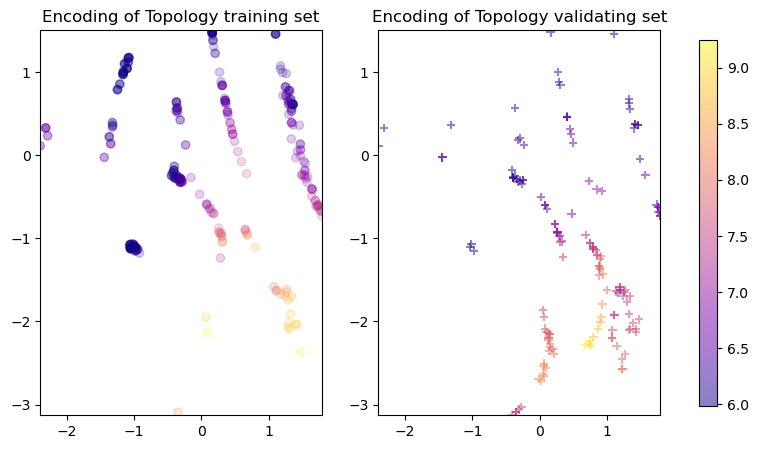

In [68]:
plot_topopt_encoding(vae_model)
# plt.savefig("Plots/Encoding_plot")

For saving the weights to be used later.

In [69]:
saved_file_name = "vae1210_ver1_gooddata.pth"  
torch.save(vae_model.state_dict(), saved_file_name)

# Load model parameters
reloaded_vae_model = VariationalAutoEncoder(
    Encoder(latent_dimensionality=4),
    Decoder(latent_dimensionality=2),
    latent_dimensionality=2).to(device)

reloaded_vae_model.load_state_dict(torch.load(saved_file_name))
reloaded_vae_model.eval()

VariationalAutoEncoder(
  (encoder): Encoder(
    (fc_1): Linear(in_features=28801, out_features=1000, bias=True)
    (fc_2): Linear(in_features=1000, out_features=100, bias=True)
    (fc_3): Linear(in_features=101, out_features=4, bias=True)
  )
  (decoder): Decoder(
    (fc_1): Linear(in_features=2, out_features=100, bias=True)
    (fc_2): Linear(in_features=100, out_features=1000, bias=True)
    (fc_3): Linear(in_features=1000, out_features=28801, bias=True)
  )
  (loss): MSELoss()
)

In [31]:
# plt.figure(figsize=(7, 7))

# n = 20  # sampling resolution
# # evenly-spaced grid sampling in latent space
# z = np.linspace(-3, 3, n)
# Z1, Z2 = np.meshgrid(z, z)
# Z = np.vstack([Z1.flatten(), Z2.flatten()]).T

# plt.scatter(Z[:, 0], Z[:, 1], s=50, c="black", label="Grid sampling")

# z = scipy.stats.norm.ppf(np.linspace(0.005, 0.995, n))
# Z1, Z2 = np.meshgrid(z, z)
# Z = np.vstack([Z1.flatten(), Z2.flatten()]).T

# plt.scatter(Z[:, 0], Z[:, 1], marker="+", s=100, c="red", label="PPF sampling")
# plt.legend(fontsize=10, bbox_to_anchor=(1, 0.5))
# plt.show()

16
[[-2.5758293  -2.5758293 ]
 [-0.42614801 -2.5758293 ]
 [ 0.42614801 -2.5758293 ]
 [ 2.5758293  -2.5758293 ]
 [-2.5758293  -0.42614801]
 [-0.42614801 -0.42614801]
 [ 0.42614801 -0.42614801]
 [ 2.5758293  -0.42614801]
 [-2.5758293   0.42614801]
 [-0.42614801  0.42614801]
 [ 0.42614801  0.42614801]
 [ 2.5758293   0.42614801]
 [-2.5758293   2.5758293 ]
 [-0.42614801  2.5758293 ]
 [ 0.42614801  2.5758293 ]
 [ 2.5758293   2.5758293 ]]
0 0
0 1
0 2
0 3
1 0
1 1
1 2
1 3
2 0
2 1
2 2
2 3
3 0
3 1
3 2
3 3
[-2.5758293  -0.42614801  0.42614801  2.5758293  -2.5758293  -0.42614801
  0.42614801  2.5758293  -2.5758293  -0.42614801  0.42614801  2.5758293
 -2.5758293  -0.42614801  0.42614801  2.5758293 ]
[-2.5758293  -2.5758293  -2.5758293  -2.5758293  -0.42614801 -0.42614801
 -0.42614801 -0.42614801  0.42614801  0.42614801  0.42614801  0.42614801
  2.5758293   2.5758293   2.5758293   2.5758293 ]


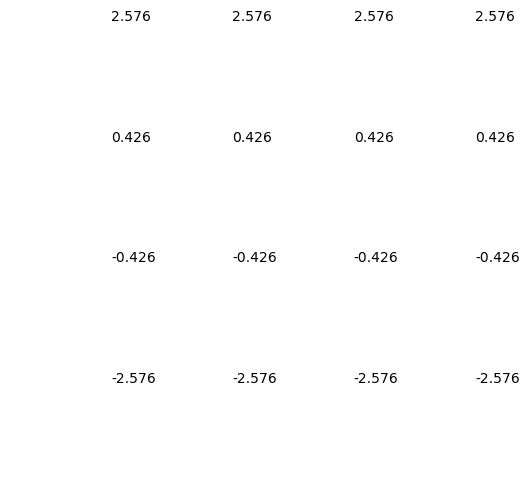

In [70]:
fig, axes = plt.subplots(4, 4, figsize=(6, 6))
count = 0
z = scipy.stats.norm.ppf(np.linspace(0.005, 0.995, 4))
Z1, Z2 = np.meshgrid(z, z)
Z = np.vstack([Z1.flatten(), Z2.flatten()]).T
print(len(Z))
print(Z)
for k in range(0, 16):

    i, j = int(count / 4), int(count % 4)
    print(i,j)
    axes[4-1-i, j].text(1,1,"{0:.3f}".format(Z[count,1]))
    axes[i, j].axis("off")
    count +=1 
print(Z[:,0])
print(Z[:,1])

## 3. Post Processing

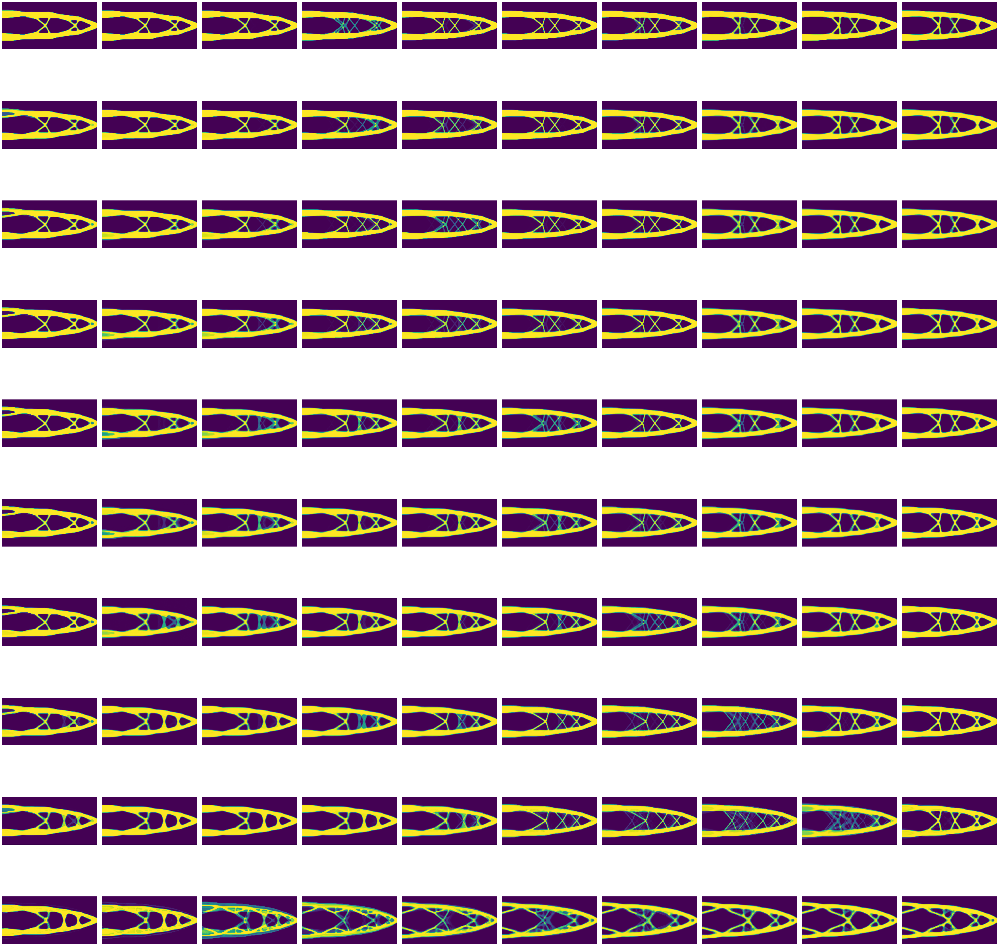

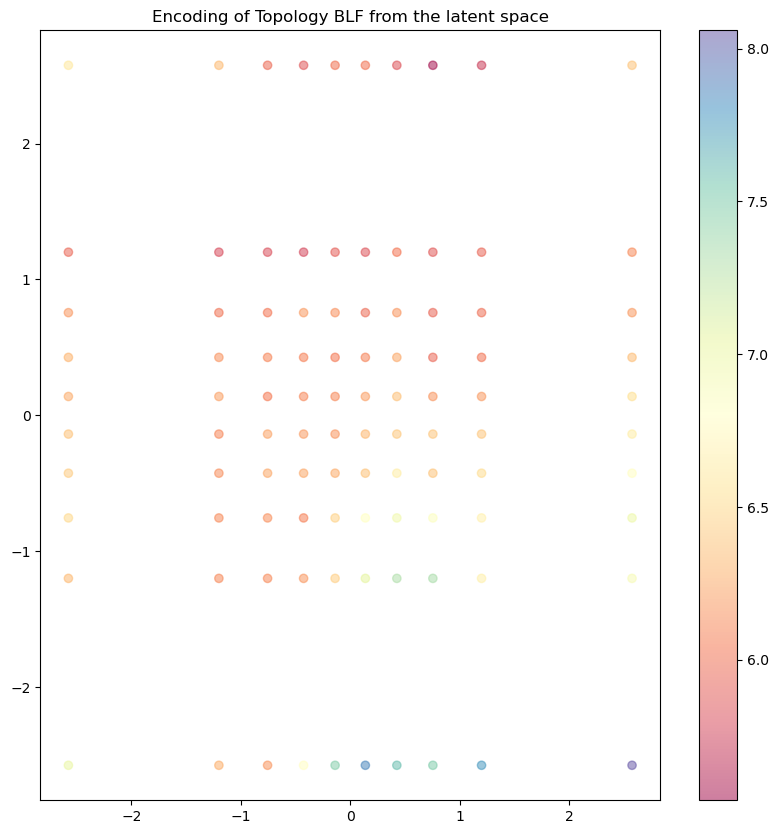

In [72]:
def plot_latent_space_no_matlab(n):

    # grid sampling in latent space
    z = scipy.stats.norm.ppf(np.linspace(0.005, 0.995, n))
    Z1, Z2 = np.meshgrid(z, z)
    Z = np.vstack([Z1.flatten(), Z2.flatten()]).T

    # decode samples
    ims = vae_model.decoder(torch.tensor(Z).float().to(device)).detach().cpu()

    fig, axes = plt.subplots(n, n, figsize=(70, 70))
    fig.subplots_adjust(hspace=0.05, wspace=0.05)
    small_reconstructed_blf_array = ims[:,-1]
    count = 0
    for k in range(0, ims.shape[0]):
        i, j = int(count / n), int(count % n)
        # print(i,j)
        axes[n-1-i, j].imshow(ims[k,:-1].reshape(120,240))
        axes[i, j].axis("off")

        np.savetxt("savelog_good/csv/latent_sample_topology_n"+str(n)+"_"+str(i)+"_" + str(j)+".csv", ims[k,:-1].reshape(120,240), delimiter=',')
        count += 1
    plt.savefig("savelog_good/Plots_topology_GaussSpace")


    fig, ax = plt.subplots(figsize=(10, 10))

    # Training data
    ax.set_title(label="Encoding of Topology BLF from the latent space")

    training_bbox = np.min(Z, axis=0), np.max(Z, axis=0)

    scatter1 = ax.scatter(
        Z[:, 0],
        Z[:, 1],
        c= small_reconstructed_blf_array,
        alpha=0.5,
        cmap="Spectral",
        label="Latent Space",
    )
    plt.colorbar(scatter1)
    plt.show()
plot_latent_space_no_matlab(10)

In [73]:
#A function to calculate the latent space along with BLF from MATLAB
def calc_latent_space(n):

    z = scipy.stats.norm.ppf(np.linspace(0.005, 0.995, n))
    Z1, Z2 = np.meshgrid(z, z)
    Z = np.vstack([Z1.flatten(), Z2.flatten()]).T
    
    # decode samples
    ims = vae_model.decoder(torch.tensor(Z).float().to(device)).detach().cpu()

    # plot
    fig, axes = plt.subplots(n, n, figsize=(35, 35))
    fig.subplots_adjust(hspace=0.05, wspace=0.05)

    structure_array = []
    blf_array_matlab = np.zeros((n,n))
    blf_array_reconstructed = np.zeros((n,n))
    count = 0

    for k in tqdm(range(0, ims.shape[0])):
        print("################")
        i, j = int(count / n), int(count % n)
        print("Number: " + str(k)+ ", (x,y) = ("+str(i)+","+str(j)+")")
        ims_array = ims[k, :-1].reshape(120,240)
        axes[n-1-i, j].imshow(ims_array)
        axes[i, j].axis("off")

        structure_array.append(ims[k,:-1])
        reconstructed_blf = ims[k,-1]
        blf_array_reconstructed[i,j] = reconstructed_blf
        filename = "logMATLABoutput/batch_"+str(n)+"_"+ str(k)
        np.savetxt( filename +'.csv', ims_array, delimiter=',')
        blf_array_matlab[i,j] = octave.getblf(filename, nout = 1)
        print(blf_array_matlab[i,j])
        # print(i,j,blf_array[i,j])
        count += 1
    plt.savefig('savelog/plot_latent_topology'+str(n))
    plt.show()
    return blf_array_matlab, blf_array_reconstructed, structure_array

# Functions to plot the blf from the calculated latent space and save
def plot_latent_space_blf(matlab_blf, my_blf, n = n):
    
    z = scipy.stats.norm.ppf(np.linspace(0.005, 0.995, n))
    Z1, Z2 = np.meshgrid(z, z)
    Z = np.vstack([Z1.flatten(), Z2.flatten()]).T

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Training data
    ax[0].set_title(label="Encoding of Topology BLF from the latent space")

    training_bbox = np.min(Z, axis=0), np.max(Z, axis=0)

    scatter1 = ax[0].scatter(
        Z[:, 0],
        Z[:, 1],
        c= my_blf,
        alpha=0.5,
        cmap="Spectral",
        label="Latent Space",
    )
    plt.colorbar(scatter1)

    # # MATLAB calc data.

    ax[1].set_title(label="Encoding of Topology BLF calc from Matlab")

    scatter2 = ax[1].scatter(
        Z[:, 0],
        Z[:, 1],
        c=matlab_blf,
        alpha=0.5,
        marker="+",
        cmap="Spectral",
    )
    plt.colorbar(scatter2)

    # ax[1].legend(*scatter.legend_elements(), title="blf", bbox_to_anchor=(1, 0.5))

    # adjust such that both subplots have same bounds
    ax[0].set_xlim(
        training_bbox[0][0]-0.5,
        training_bbox[1][0]+0.5,
    )

    ax[0].set_ylim(
        training_bbox[0][1]-0.5,
        training_bbox[1][1]+0.5
    )

    ax[1].set_xlim(
        training_bbox[0][0]-0.5,
        training_bbox[1][0]+0.5,
    )

    ax[1].set_ylim(
        training_bbox[0][1]-0.5,
        training_bbox[1][1]+0.5
    )

    return fig

def plot_normalized_latent_space_blf(matlab_blf, my_blf, n = n):
    
    z = scipy.stats.norm.ppf(np.linspace(0.005, 0.995, n))
    Z1, Z2 = np.meshgrid(z, z)
    Z = np.vstack([Z1.flatten(), Z2.flatten()]).T

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Training data
    ax[0].set_title(label="Encoding of Topology BLF from the latent space")

    training_bbox = np.min(Z, axis=0), np.max(Z, axis=0)

    scatter1 = ax[0].scatter(
        Z[:, 0],
        Z[:, 1],
        c= my_blf/np.max(my_blf),
        alpha=0.5,
        cmap="Spectral",
        label="Our Model",
    )
    plt.colorbar(scatter1)

    # # MATLAB calc data.

    ax[1].set_title(label="Encoding of Topology BLF calc from Matlab")

    scatter2 = ax[1].scatter(
        Z[:, 0],
        Z[:, 1],
        c=matlab_blf/np.max(matlab_blf),
        alpha=0.5,
        marker="+",
        cmap="Spectral",
        label = "MATLAB"
    )
    plt.colorbar(scatter2)

    # ax[1].legend(*scatter.legend_elements(), title="blf", bbox_to_anchor=(1, 0.5))

    # adjust such that both subplots have same bounds
    ax[0].set_xlim(
        training_bbox[0][0]-0.5,
        training_bbox[1][0]+0.5,
    )

    ax[0].set_ylim(
        training_bbox[0][1]-0.5,
        training_bbox[1][1]+0.5
    )

    ax[1].set_xlim(
        training_bbox[0][0]-0.5,
        training_bbox[1][0]+0.5,
    )

    ax[1].set_ylim(
        training_bbox[0][1]-0.5,
        training_bbox[1][1]+0.5
    )

    return fig

def plot_distribution(matlab_blf, my_blf):
    # histrogram of the distribution of the training and the validating sets
    fig = plt.figure()
    plt.suptitle("Reconstructed BLF Distribution")

    fig.add_subplot(1, 2, 1) 
    plt.title('Dataset')
    plt.hist(design_vectors[:,-1], bins = 20, color = 'skyblue')
    a=plt.gca()
    a.set_xlabel("BLF")
    a.set_ylabel("Numbers")
    a.set_ylim([0, 150])
    a.set_xlim([0, 12])

    fig.add_subplot(2,2,2)
    plt.title('Predicted Set') 
    plt.hist(my_blf.flatten(), bins = 20, color = 'steelblue', label = 'predicted', alpha = 0.5)
    a=plt.gca()
    a.set_xlim([0, 12])
    plt.xticks([])


    fig.add_subplot(2,2,4)
    plt.title('MATLAB Set')
    plt.hist(matlab_blf.flatten(), bins = 20, color = 'salmon', label = 'actual', alpha = 0.5)
    a=plt.gca()
    a.set_xlabel("BLF")
    # a.set_ylabel("Numbers")
    # a.set_ylim([0, 500])
    a.set_xlim([0, 12])
    # a.legend()
    return fig
    
def plot_and_save(n):
    matlab_blf, my_blf, topologies = calc_latent_space(n)
    np.savetxt( 'savelog/csv/matlab_blf_' +str(n) +'.csv', matlab_blf, delimiter=',')
    np.savetxt( 'savelog/csv/my_blf_' +str(n) +'.csv', my_blf , delimiter=',')
    np.savetxt( 'savelog/csv/topologies_' +str(n) +'.csv', topologies , delimiter=',')

    fig_original = plot_latent_space_blf(matlab_blf, my_blf, n)
    plt.savefig('savelog/plot_original_'+str(n))
    fig_normalized = plot_normalized_latent_space_blf(matlab_blf, my_blf, n)
    plt.savefig('savelog/plot_normalized_'+str(n))

    plot_distribution(matlab_blf, my_blf)
    plt.savefig("savelog/plot_BLF_distribution_predicted_actual"+str(n))

  0%|          | 0/9 [00:00<?, ?it/s]

################
Number: 0, (x,y) = (0,0)
6.145505968213328
################
Number: 1, (x,y) = (0,1)
7.8920567622773365
################
Number: 2, (x,y) = (0,2)
7.6476038633611765
################
Number: 3, (x,y) = (1,0)
6.404544029244783
################
Number: 4, (x,y) = (1,1)
6.329322358588208
################
Number: 5, (x,y) = (1,2)
6.634406288131739
################
Number: 6, (x,y) = (2,0)
6.046244608079158
################
Number: 7, (x,y) = (2,1)
6.041652660334696
################
Number: 8, (x,y) = (2,2)
6.107608207190135


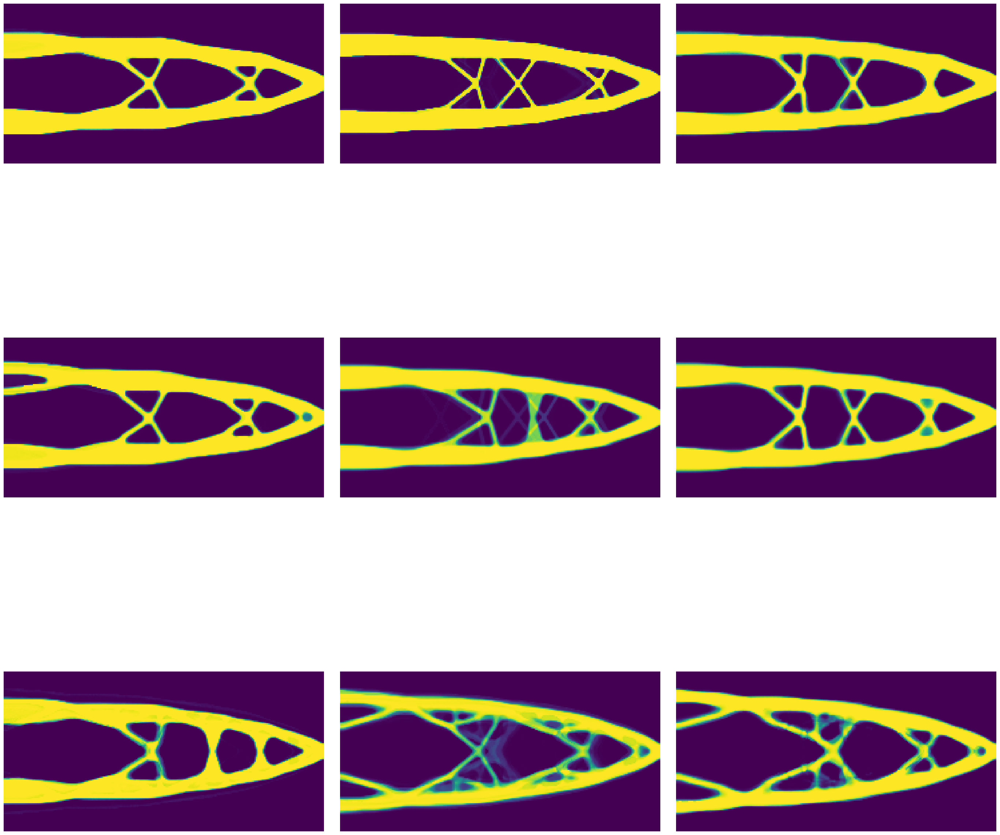

  0%|          | 0/25 [00:00<?, ?it/s]

################
Number: 0, (x,y) = (0,0)
6.145505933895197
################
Number: 1, (x,y) = (0,1)
7.595578079843607
################
Number: 2, (x,y) = (0,2)
7.892056400585418
################
Number: 3, (x,y) = (0,3)
7.357514216234258
################
Number: 4, (x,y) = (0,4)
7.647603865719692
################
Number: 5, (x,y) = (1,0)
6.396078060181418
################
Number: 6, (x,y) = (1,1)
6.210789630087518
################
Number: 7, (x,y) = (1,2)
6.565701851500119
################
Number: 8, (x,y) = (1,3)
7.121246451386996
################
Number: 9, (x,y) = (1,4)
6.7665040939055
################
Number: 10, (x,y) = (2,0)
6.404544021915382
################
Number: 11, (x,y) = (2,1)
6.27776939620234
################
Number: 12, (x,y) = (2,2)
6.329322365149537
################
Number: 13, (x,y) = (2,3)
6.6594433298495375
################
Number: 14, (x,y) = (2,4)
6.634406303444355
################
Number: 15, (x,y) = (3,0)
6.331961635594373
################
Number: 16, (x,y) =

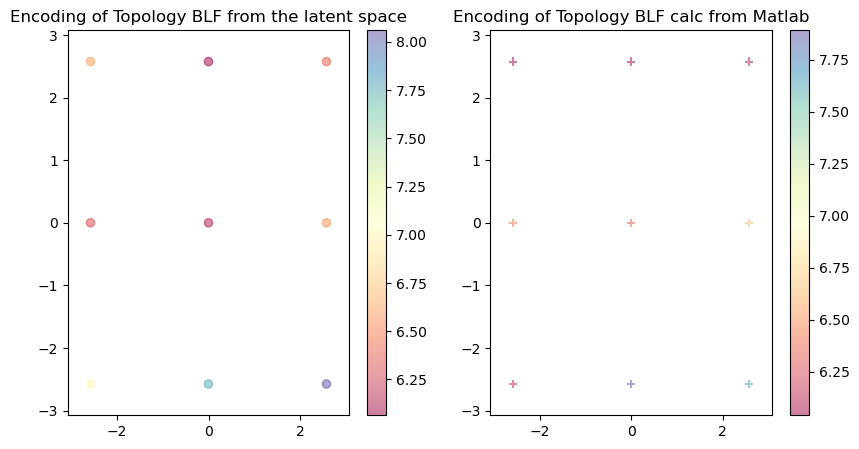

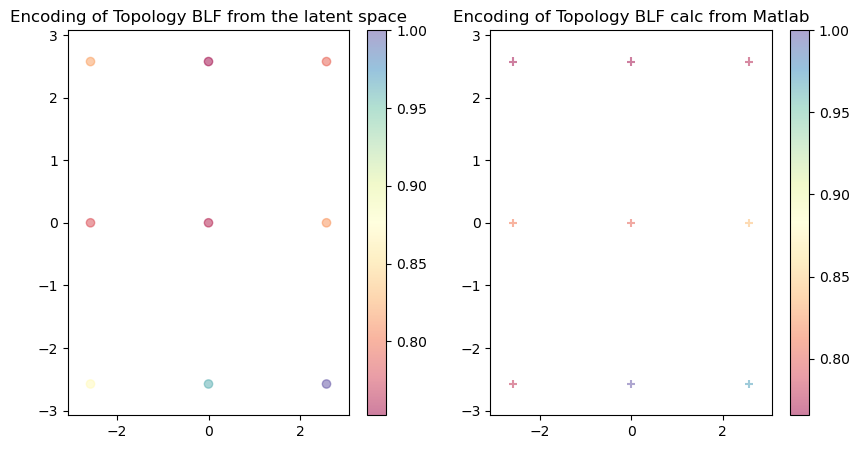

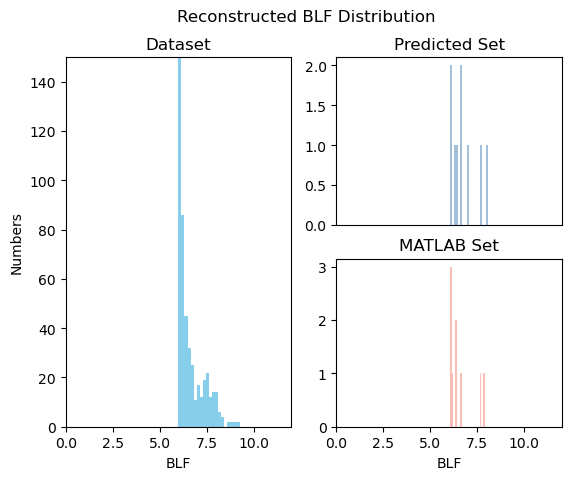

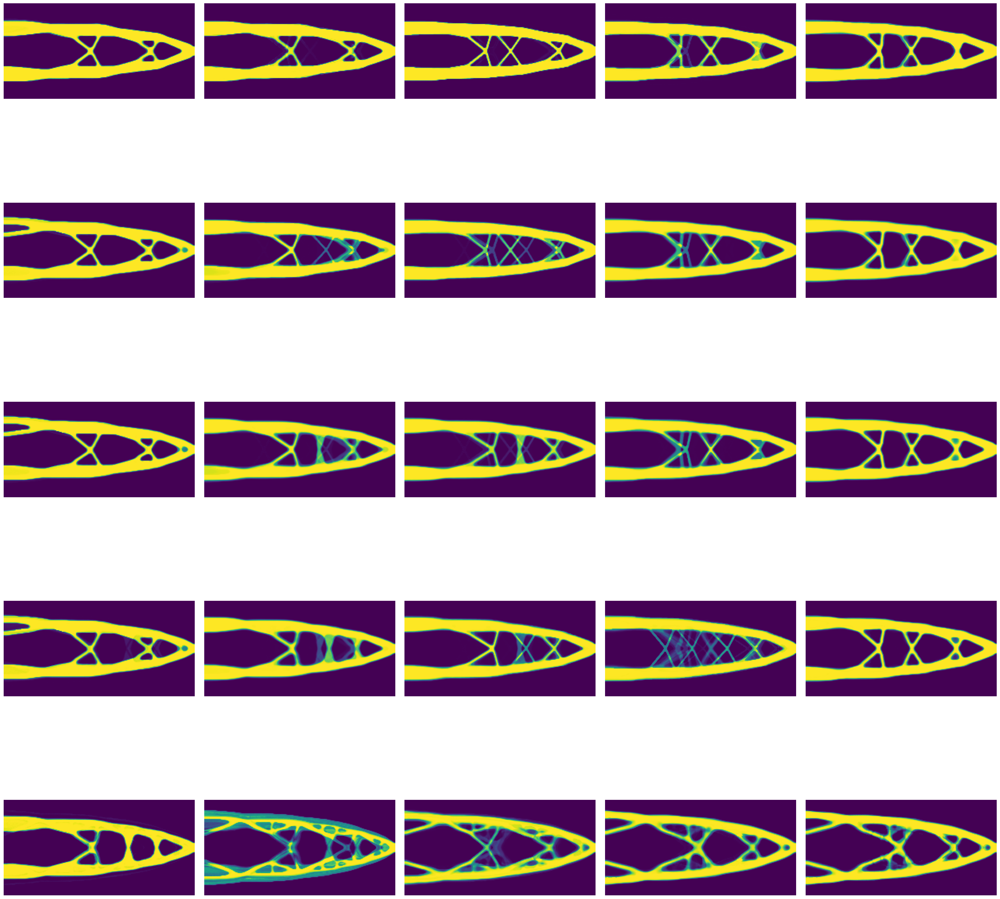

  0%|          | 0/100 [00:00<?, ?it/s]

################
Number: 0, (x,y) = (0,0)
6.145505926723171
################
Number: 1, (x,y) = (0,1)
6.270150264533208
################
Number: 2, (x,y) = (0,2)
7.202664398732114
################
Number: 3, (x,y) = (0,3)
8.216349920948854
################
Number: 4, (x,y) = (0,4)
8.111292805163185
################
Number: 5, (x,y) = (0,5)
7.68418627138084
################
Number: 6, (x,y) = (0,6)
6.695070067551542
################
Number: 7, (x,y) = (0,7)
7.699559278153517
################
Number: 8, (x,y) = (0,8)
7.67445329020406
################
Number: 9, (x,y) = (0,9)
7.647603847973526
################
Number: 10, (x,y) = (1,0)
6.203513009822271
################
Number: 11, (x,y) = (1,1)
6.08250978181619
################
Number: 12, (x,y) = (1,2)
6.102207344999431
################
Number: 13, (x,y) = (1,3)
6.1635552078211475
################
Number: 14, (x,y) = (1,4)
6.490520057429792
################
Number: 15, (x,y) = (1,5)
7.062943626838096
################
Number: 16, (x,y) =

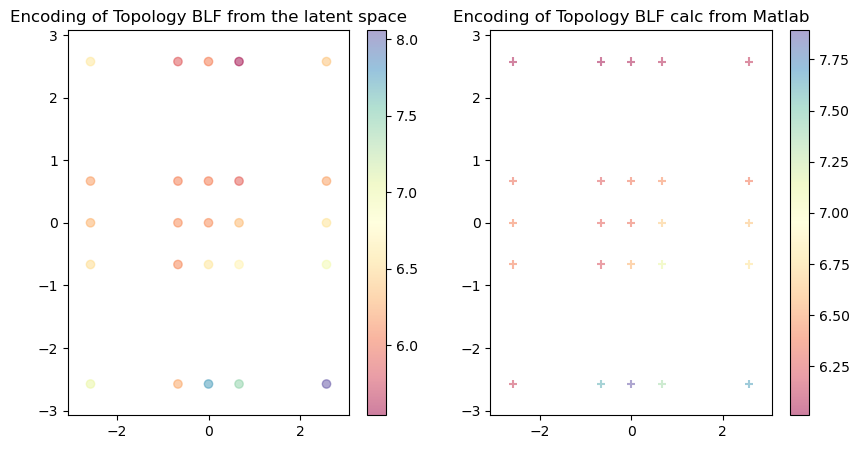

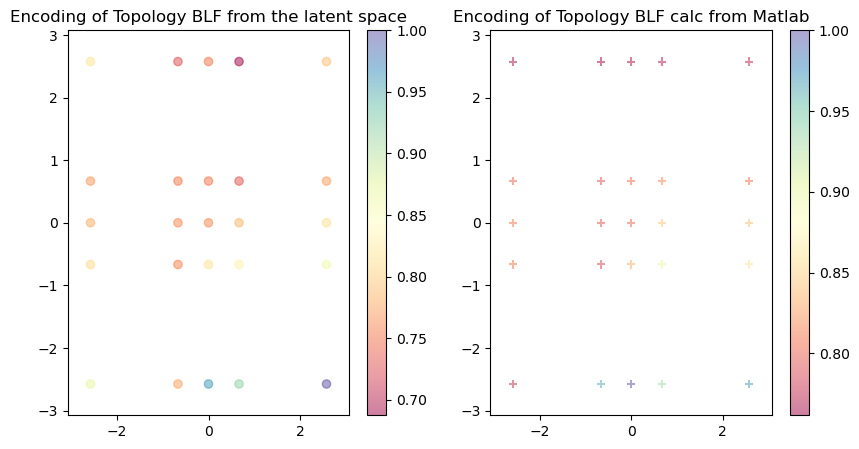

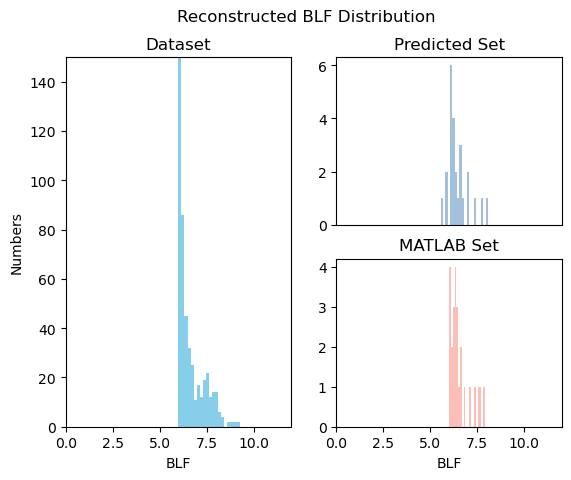

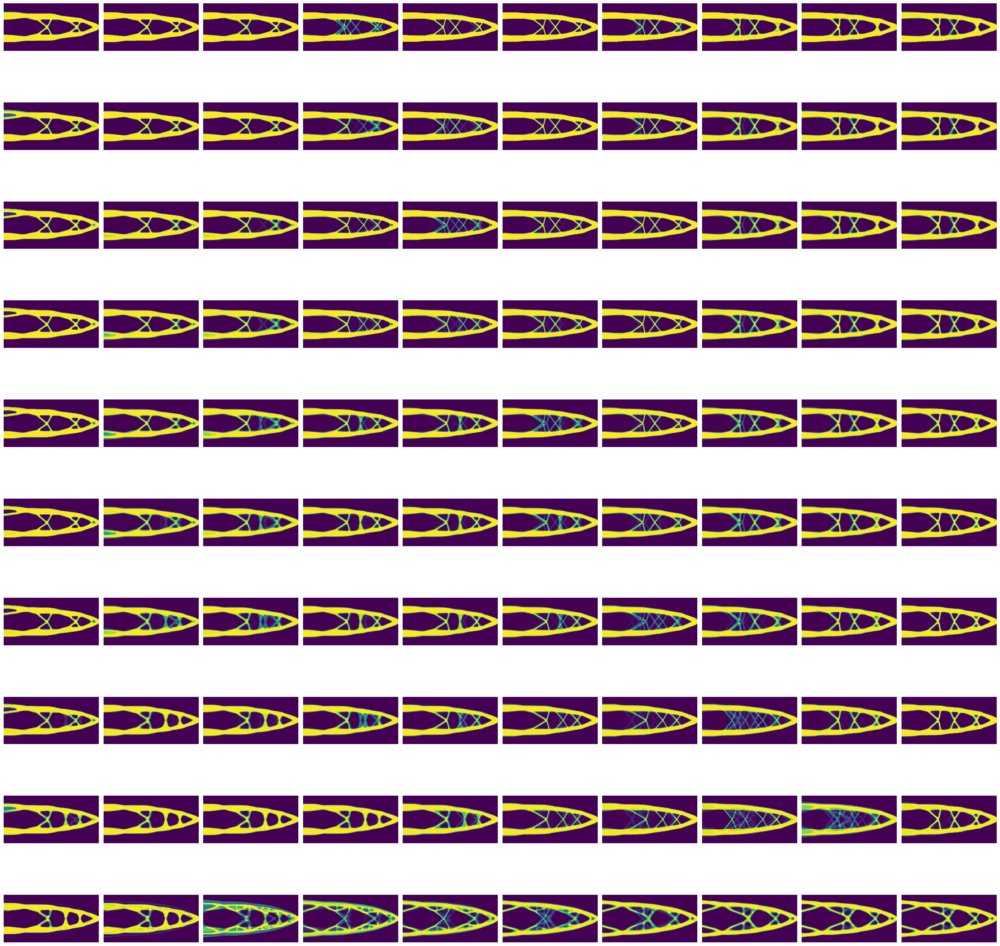

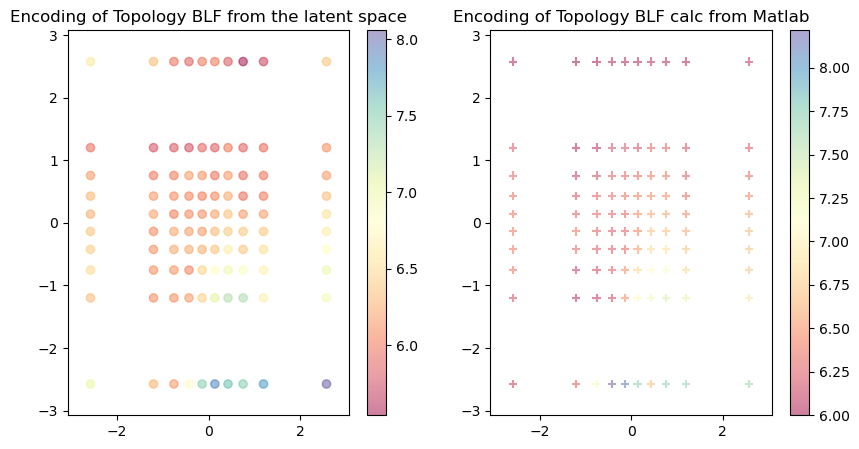

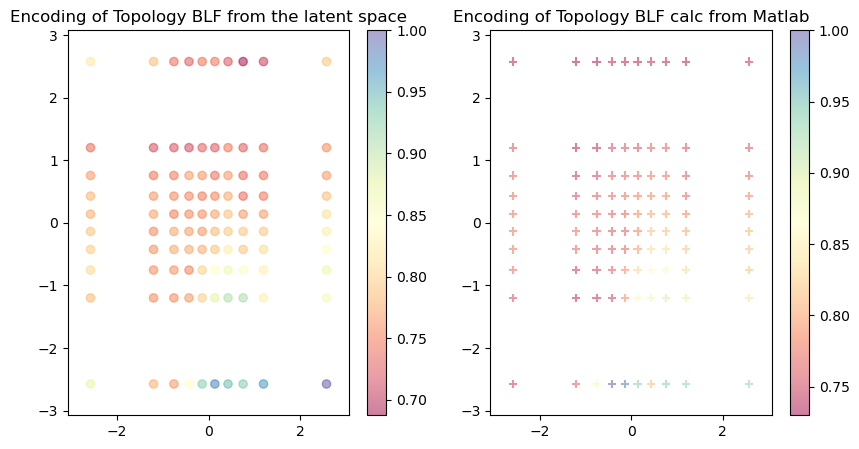

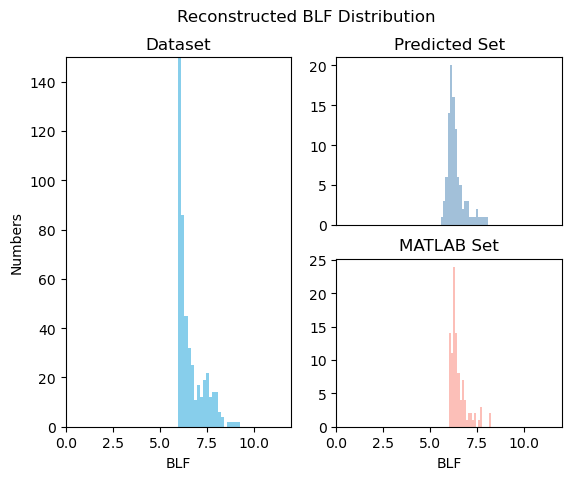

In [74]:
plot_and_save(3)
plot_and_save(5)
plot_and_save(10)

## This block will take ~ a day, so...

  0%|          | 0/25 [00:00<?, ?it/s]

0
6.188849663833981
1
5.983625668718873
2
5.8412649291747245
3
5.75567712387357
4
4.087937211445458
5
3.074384028885909
6
6.538443984024254
7
5.983599243905755
8
5.582711659080022
9
3.5041838659531774
10
6.772107773303152
11
6.770231247520596
12
6.343509084209994
13
4.40921085666333
14
3.067247597556299
15
7.92164910958876
16
7.671469524683736
17
8.025920899234949
18
5.385032345196418
19
2.874147734798409
20
9.027333208027157
21
9.403101265827743
22
7.059477864909176
23
4.896901440538726
24
2.4188730094194355


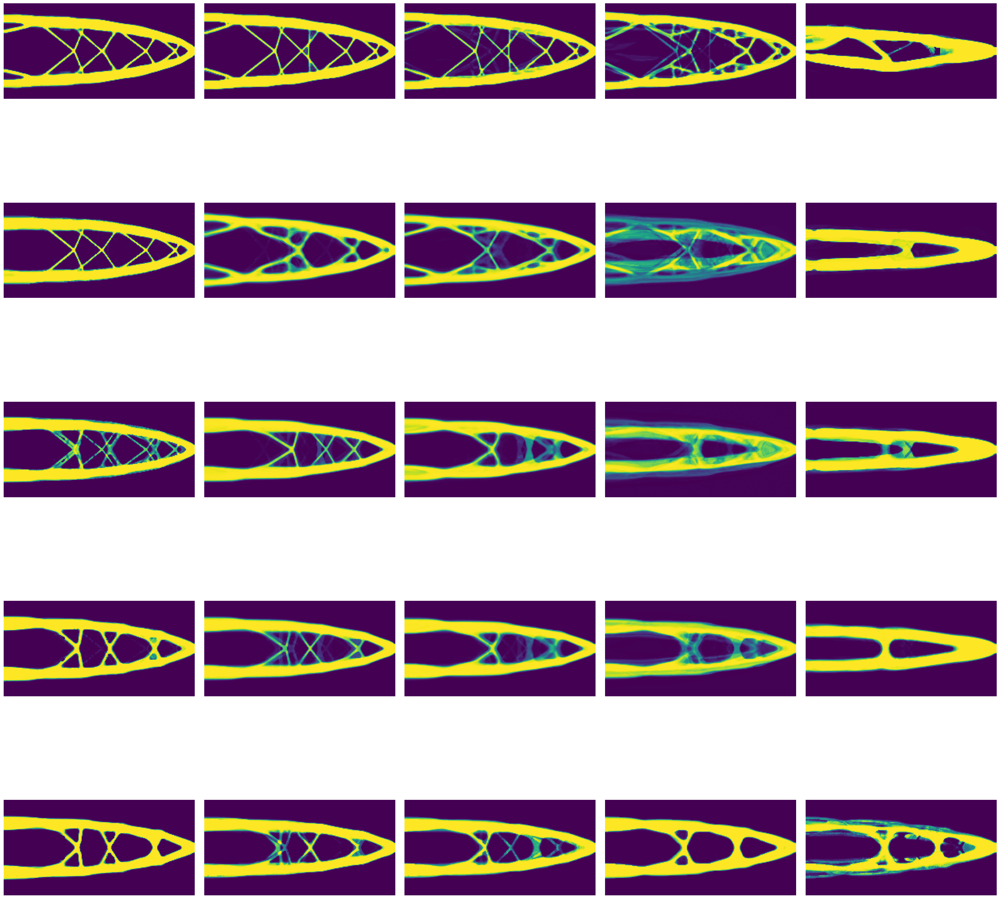

  0%|          | 0/100 [00:00<?, ?it/s]

0
6.188849680505859
1
6.087899751010222
2
6.0016026129960425
3
5.928418968311081
4
5.876806723585106
5
5.790942017315502
6
5.763527252524328
7
5.75381386902682
8
5.740503693448635
9
4.087934721786509
10
3.27873300887145
11
6.394071310925168
12
6.341057239489671
13
6.1474478775041135
14
5.876651519939978
15
5.722660323114747
16
5.640184232569317
17
5.584794837855441
18
4.819152832470337
19
3.584408924755727
20
3.0359482967315867
21
6.6184921434711015
22
6.538054490869579
23
6.3475460928417435
24
6.049073431727745
25
5.898856427392998
26
5.818898097566551
27
5.3859942411676265
28
3.842760715580934
29
3.5241936079668696
30
3.4684241034055994
31
6.824021821340576
32
6.671367596908718
33
6.3976300393557235
34
6.147418666409859
35
6.032949116053263
36
5.917771148376257
37
4.588879047111327
38
3.730343022784815
39
3.418897733973576
40
4.81665500387104
41
7.01206248646073
42
6.777344912053807
43
6.231618150079032
44
6.283825728223942
45
6.190943602709864
46
6.0026678046096995
47
4.137631502595

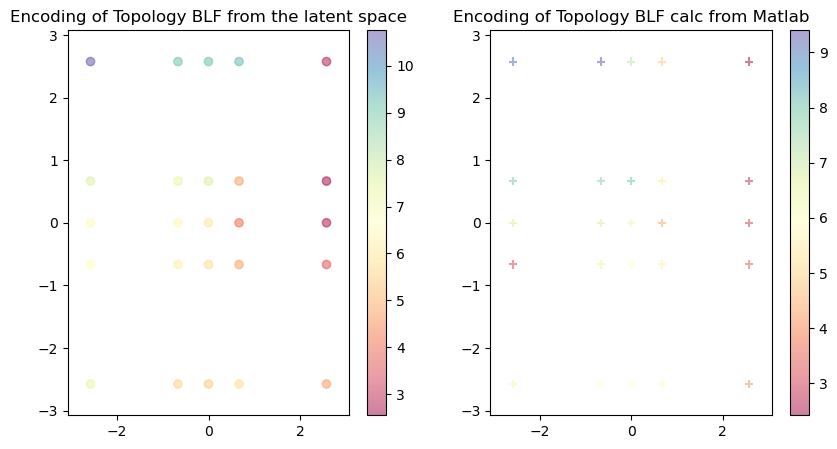

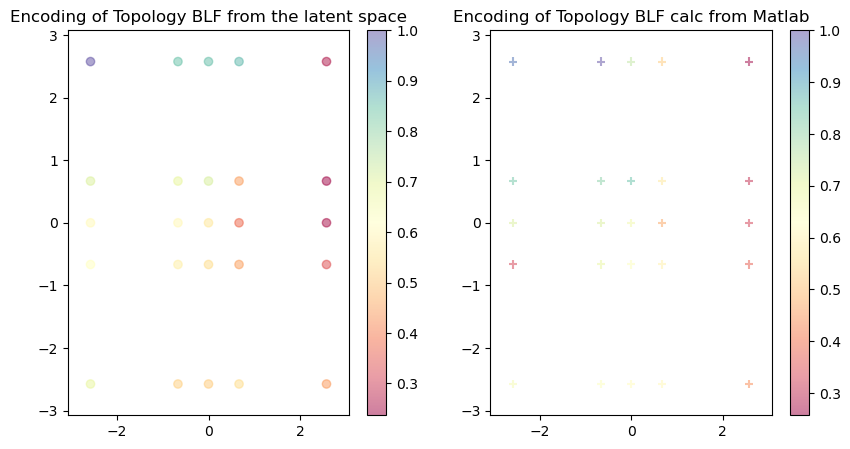

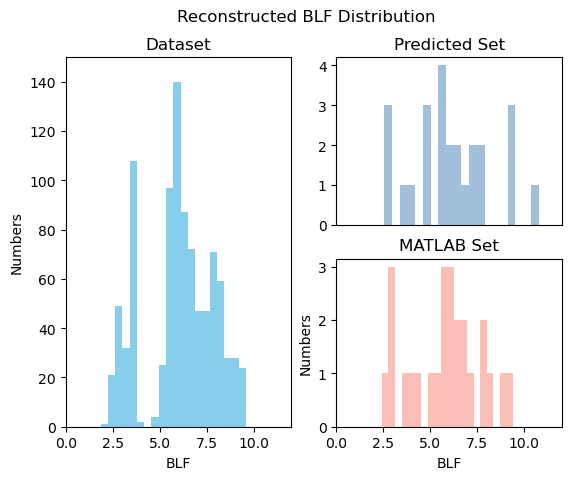

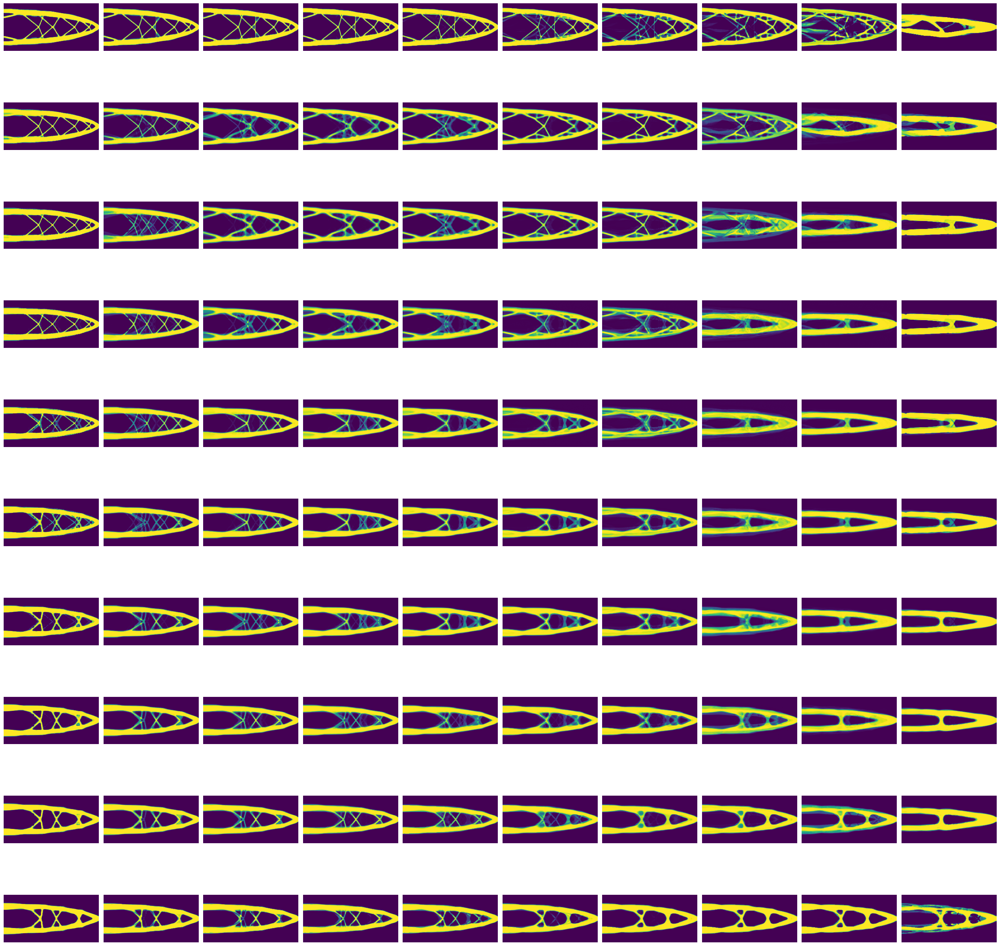

  0%|          | 0/400 [00:00<?, ?it/s]

0
6.188849678364314
1
6.133924427453944
2
6.093010444461662
3
6.047467618787409
4
6.009349436416506
5
5.975076688760036
6
5.939291822529917
7
5.90692202050833
8
5.884710151684363
9
5.862069460914206
10
5.815668636187321
11
5.77860101433812
12
5.767713347782467
13
5.761537644937214
14
5.756266965207334
15
5.7529763261164995
16
5.748753335892309
17
5.739089288875444
18
5.722737783181745
19
4.087936561158639
20
5.0384498273643485
21
6.308174323934298
22
6.287170309645256
23
6.2670386603427
24
6.235080451226533
25
6.166315218408727
26
6.061060813860489
27
5.940479203573054
28
5.853872404864469
29
5.812097917010732
30
5.759897953107158
31
5.683653708199823
32
5.643644248476444
33
5.638410431350243
34
5.633203776867437
35
5.6263723985608936
36
5.603723475622473
37
5.520400167843729
38
4.542692458362661
39
3.6246671287607692
40
3.3350465954707302
41
6.417306514552691
42
6.385082528681473
43
6.371104991149974
44
6.34022150915809
45
6.286142478181475
46
6.1800790565041455
47
6.043660631354687
4

In [ ]:
# plot_and_save(5)
plot_and_save(10)
plot_and_save(20)
plot_and_save(30)
# plot_and_save(40)
# plot_and_save(50)



Plot the 5 highest performance topologies

In [ ]:
#load the csv and blf
topologies = np.array(genfromtxt("savelog/csv/topologies_50.csv", delimiter=','))
blfs = np.array(genfromtxt("savelog/csv/my_blf_50.csv", delimiter=','))



(2500, 28800)
(50, 50)


In [ ]:
print(topologies.shape)
print(blfs.shape)

(2500, 28800)
(50, 50)


In [ ]:
idx = np.argmax(blfs)
print(idx)
top_blfs = np.array(blfs.flatten()[idx])
top_topologies = np.array(topologies[idx])

2499


In [ ]:
print(top_topologies.shape)

# print(top_topologies)
for i in top_topologies:
    print(i)

print(top_blfs)
np.savetxt( 'savelog/csv/top_topology.csv', top_topologies , delimiter=',')
    

(28800,)
7.602082405355759e-06
4.893876848655054e-06
4.108067969355034e-06
5.445512215374038e-06
3.952545284846565e-06
1.7255528064197279e-06
2.996749344674754e-06
2.183704054914415e-06
2.6444286049809307e-06
1.524296294519445e-06
5.473972578329267e-06
3.803051413342473e-06
1.0937622391793411e-05
6.1451178225979675e-06
3.9753444980306085e-06
3.1783677059138427e-06
1.0353812740504509e-06
4.083168278157245e-06
4.023769633931806e-06
3.2931584428297356e-06
3.0792316465522163e-06
1.8075413663609652e-06
2.984806997119449e-06
3.0140636226860806e-06
5.383051302487729e-06
2.9796819944749586e-06
2.3326304017246002e-06
1.5557142205580021e-06
6.82059908285737e-06
5.147936462890357e-06
8.837246809889621e-07
6.337227659969358e-06
6.6874017647933215e-06
7.9140017987811e-06
3.638066573330434e-06
4.890125183010241e-06
7.448429641954135e-06
1.5299600590878981e-06
2.959501216537319e-06
4.255543444742216e-06
5.123838946019532e-06
1.5686800907133147e-06
1.0117372767126653e-05
6.5879257817869075e-06
2.47657

IndexError: too many indices for array: array is 0-dimensional, but 1 were indexed

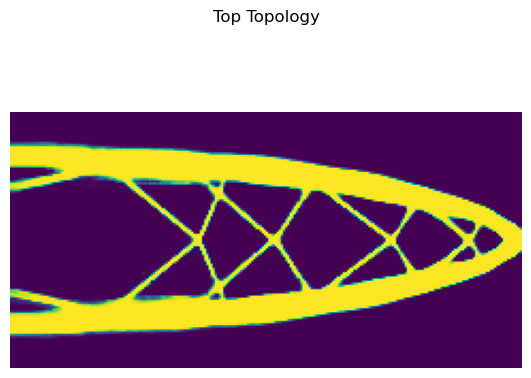

In [ ]:
fig = plt.figure()
plt.suptitle("Top Topology")

plt.axis('off') 
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=1, 
                    hspace=0.5)

# for i in range(1,n+1):
#     for j in range(1,n+1):
        # count +=1 
        # fig.add_subplot(n, n, count) 


plt.imshow(top_topologies.reshape(120,240))
# plt.title("Idx:"+ str(idx)+ " || BLF: " + str(top_blfs[idx])) 
a=plt.gca()
a.title.set_size(10)

# np.random.seed(seed=None)
# plt.savefig("Plots/Example_Plots_of_inputs")

In [ ]:
# blf_flatten = blf_array_reconstructed.flatten()
# good = np.array(structure_array)[blf_flatten > 10]
# n_good = np.shape(good)[0]
# print("There are " + str(np.shape(good)[0]) + " high performance structures")

# fig, axes = plt.subplots(n_good,1,figsize=(35, 70))
# fig.subplots_adjust(hspace=0.05, wspace=2)
# count = 0
# for i in range(n_good):
#     ims = good[i]
#     axes[i].imshow(ims.reshape(120,240))
#     axes[i].text(10,20,'{0:.3f}'.format(blf_flatten[blf_flatten >8][i]))
#     axes[i].axis("off")
#     count += 1
# # plt.savefig("Plots/Plots_topology_GaussSpace")
# plt.show()

In [ ]:
# np.savetxt( "1204blf_latent_arrays" +'.csv', blf_array_reconstructed, delimiter=',')
# np.savetxt( "1204blf_matlab_arrays" +'.csv', blf_array_matlab, delimiter=',')


In [ ]:
# fig2, ax2 = plt.subplots(1, 1, figsize=(10, 10))
# ax2.axis('equal')
# ax2.plot(np.linspace(0,20,20), np.linspace(0,20,20), c = 'r')
# ax2.scatter(blf_array_matlab.flatten(), blf_array_reconstructed.flatten())
# plt.xlabel("MATLAB")
# plt.ylabel("Reconstructed")
# plt.show()

In [ ]:
# fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# # Training data
# ax[0].set_title(label="Encoding of Topology BLF from the latent space")

# training_bbox = np.min(Z, axis=0), np.max(Z, axis=0)

# scatter1 = ax[0].scatter(
#     Z[:, 0],
#     Z[:, 1],
#     c= blf_array_reconstructed,
#     alpha=0.2,
#     cmap="plasma",
#     label="Training",
# )
# plt.colorbar(scatter1)

# # # MATLAB calc data.

# ax[1].set_title(label="Encoding of Topology BLF calc from Matlab")


# scatter2 = ax[1].scatter(
#     Z[:, 0],
#     Z[:, 1],
#     c=blf_array_matlab-blf_array_reconstructed,
#     alpha=0.5,
#     marker="+",
#     cmap="plasma",
# )
# plt.colorbar(scatter2)

# # ax[1].legend(*scatter.legend_elements(), title="blf", bbox_to_anchor=(1, 0.5))

# # adjust such that both subplots have same bounds
# ax[0].set_xlim(
#     training_bbox[0][0]-0.5,
#     training_bbox[1][0]+0.5,
# )

# ax[0].set_ylim(
#     training_bbox[0][1]-0.5,
#     training_bbox[1][1]+0.5
# )

# ax[1].set_xlim(
#     training_bbox[0][0]-0.5,
#     training_bbox[1][0]+0.5,
# )

# ax[1].set_ylim(
#     training_bbox[0][1]-0.5,
#     training_bbox[1][1]+0.5
# )


In [ ]:
# from mpl_toolkits.mplot3d import axes3d
# import matplotlib.pyplot as plt
# import numpy as np

# # np.random.seed(1234)
# fig = plt.figure()
# ax1 = fig.add_subplot(111, projection='3d')
# # A = np.random.randint(5, size=(25, 10))
# A = blf_array

# x = np.array([[i] * n for i in range(n)]).ravel() # x coordinates of each bar
# y = np.array([i for i in range(n)] * n) # y coordinates of each bar